# Import Packages

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import random
import os
import datetime
from tqdm import tqdm

import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, MaxPooling2D, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger, ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Loading datasets

#### Reading Paths and classes_names

In [3]:
train_path = "../input/seti-data/primary_small/train"
val_path = "../input/seti-data/primary_small/valid"

classes_list = os.listdir("../input/seti-data/primary_small/train")
classes_list

['narrowband',
 'noise',
 'brightpixel',
 'squarepulsednarrowband',
 'narrowbanddrd',
 'squiggle',
 'squigglesquarepulsednarrowband']

****turns out that the order of subdirectories(classes) differ from the order of classes read by the os.listdir()****

****so we'll explicitly sort the classes to be in the same order of the subdirectories****

In [4]:
classes_list = sorted(os.listdir("../input/seti-data/primary_small/train"))
classes_list

['brightpixel',
 'narrowband',
 'narrowbanddrd',
 'noise',
 'squarepulsednarrowband',
 'squiggle',
 'squigglesquarepulsednarrowband']

## Loading training datset 

In [5]:
batch_size= 128
train_ds = image_dataset_from_directory(
    train_path,
    batch_size = batch_size)

Found 5600 files belonging to 7 classes.


## Visualizing the training dataset

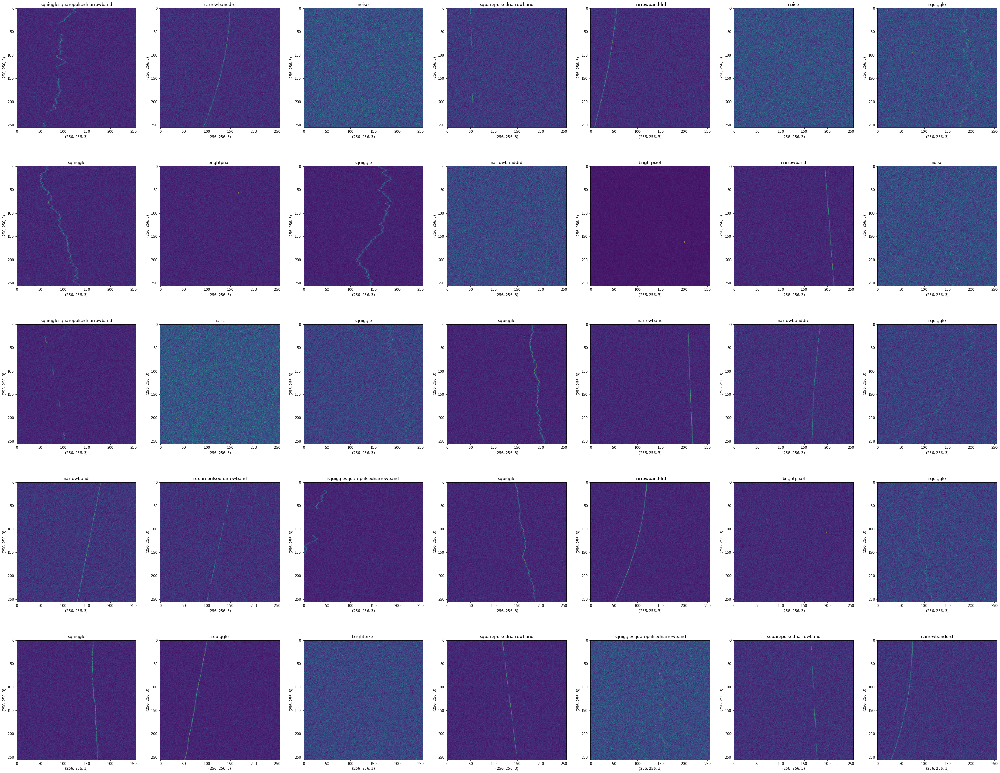

In [6]:
plt.figure(figsize=(50, 40))
for images, labels in train_ds.take(1):
    for i in range(1, 36):
        plt.subplot(5, 7, i)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(classes_list[labels[i]])
        plt.xlabel(images[i].numpy().astype("uint8").shape)
        plt.ylabel(images[i].numpy().astype("uint8").shape)
        # plt.axis('off')

****turns out that the position of the signal in the image is not imortant, because the same signal can be in different parts of the image, 
the impotant factor is the shape of the signal it self****

****the size of the images is (256, 256) so we need to resize all the images to be (256, 256) to make sure that all the images have the same size when fed into the CNN****

## Loading validation dataset

In [7]:
val_ds = image_dataset_from_directory(
    val_path, 
    batch_size=batch_size)

Found 700 files belonging to 7 classes.


### verifying the shape of the batches in training dataset

In [8]:
for img_batch, label_batch in train_ds.take(1):
    print('image batch shape: ', img_batch.shape)
    print('label_batch shape: ', label_batch.shape)

image batch shape:  (128, 256, 256, 3)
label_batch shape:  (128,)


### verifying the shape of the batches in validation dataset

In [9]:
for img_batch, label_batch in val_ds.take(1):
    print('image batch shape: ', img_batch.shape)
    print('label_batch shape: ', label_batch.shape)

image batch shape:  (128, 256, 256, 3)
label_batch shape:  (128,)


# Normalizing and Resizing the images

****the images pixels from 0 to 255 and we wnat to rescale it to be from 0 to 1****

In [10]:
img_width = 256
img_height = 256

resizing_layer = tf.keras.layers.experimental.preprocessing.Resizing(img_width, img_height)
normalizing_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)

In [11]:
train_ds = train_ds.map(lambda x, y: (resizing_layer(x), y))
train_ds = train_ds.map(lambda x, y: (normalizing_layer(x), y))

In [12]:
val_ds = val_ds.map(lambda x, y: (resizing_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalizing_layer(x), y))

### Exploring the shape of the imgaes and the values of the pixels, it should be from 0 to 1

****Train dataset****

In [13]:
img_batch, label_batch = next(iter(train_ds))
img = img_batch[0]
label = label_batch[0]

print(np.min(img), ' --> ', np.max(img))
print('shape: ', img.shape)
print('label: ', label)

0.056372553  -->  0.58480394
shape:  (256, 256, 3)
label:  tf.Tensor(3, shape=(), dtype=int32)


all images now range from 0 to 1

****validation dataset****

In [14]:
img_batch, label_batch = next(iter(val_ds))
img = img_batch[0]
label = label_batch[0]

print(np.min(img), ' --> ', np.max(img))
print('shape: ', img.shape)
print('label: ', label)

0.009803922  -->  0.52254903
shape:  (256, 256, 3)
label:  tf.Tensor(0, shape=(), dtype=int32)


same all images now range from 0 to 1

# Configure the dataset for performane

****Let's make sure to use buffered prefetching, so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data.****

> ****.cache() keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.****

> ****.prefetch() overlaps data preprocessing and model execution while training.****

****Interested readers can learn more about both methods, as well as how to cache data to disk in the [data performance guide.](http://www.tensorflow.org/guide/data_performance#prefetching)****

In [15]:
AutoTune = tf.data.experimental.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AutoTune)
val_ds = train_ds.cache().prefetch(buffer_size=AutoTune)

# Creating the Model

In [38]:
num_classes = len(classes_list)

inputs = Input(shape=(img_width, img_height, 3))

x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(inputs)
x = MaxPooling2D(pool_size=(5, 5))(x)
x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(5, 5))(x)
x = Dropout(0.15)(x)

x = Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.15)(x)

x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(0.15)(x)

x = Flatten()(x)

x = Dense(1024, activation='relu')(x)
x = Dropout(0.4)(x)

classifier = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=inputs, outputs=classifier)

In [39]:
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

****We'll use the EarlyStopping callback to prevent overfitting, if the 'val_loss' stops improving for a patience times which is 5 here it will stop training****

****we'll use CSVLogger to record the model performance per epoch****

In [40]:
epochs = 30
# log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
model.fit(train_ds,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=val_ds,
          callbacks=[EarlyStopping(monitor='val_loss', patience=5, verbose=1, restore_best_weights=True),
                     CSVLogger("train.csv")])

Epoch 1/30
44/44 [==============================] - 12s 236ms/step - loss: 1.9054 - accuracy: 0.1888 - val_loss: 1.8364 - val_accuracy: 0.2427
Epoch 2/30
44/44 [==============================] - 9s 210ms/step - loss: 1.7879 - accuracy: 0.2549 - val_loss: 1.7456 - val_accuracy: 0.2663
Epoch 3/30
44/44 [==============================] - 9s 211ms/step - loss: 1.7364 - accuracy: 0.2805 - val_loss: 1.7001 - val_accuracy: 0.2934
Epoch 4/30
44/44 [==============================] - 9s 211ms/step - loss: 1.7202 - accuracy: 0.2926 - val_loss: 1.6884 - val_accuracy: 0.2952
Epoch 5/30
44/44 [==============================] - 9s 210ms/step - loss: 1.6643 - accuracy: 0.3019 - val_loss: 1.6539 - val_accuracy: 0.3171
Epoch 6/30
44/44 [==============================] - 9s 210ms/step - loss: 1.6521 - accuracy: 0.3095 - val_loss: 1.6392 - val_accuracy: 0.3168
Epoch 7/30
44/44 [==============================] - 9s 211ms/step - loss: 1.6374 - accuracy: 0.3222 - val_loss: 1.5865 - val_accuracy: 0.3414
Epoch

# Save model architecture and weights

In [41]:
model.save("radio_signals_classifier.h5")
model.save_weights("radio_signals.weights.h5")

### writing model as json file

In [42]:
json_model = model.to_json()

with open("./radio_signal_classifier.json", 'w') as json_file:
    json_file.write(json_model)

# plot the model accuracy and loss

In [43]:
def plot_accuray(history):
    plt.figure(figsize=(12, 8))
    plt.title("Intel Image Model Accuracy")
    plt.plot(history.history['accuracy'], color='g')
    plt.plot(history.history['val_accuracy'], color='b')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend(['train', 'val'], loc="lower right")
    plt.show()

In [44]:
def plot_loss(history):
    plt.figure(figsize=(12, 8))
    plt.title("Intel Image Model Loss")
    plt.plot(history.history['loss'], color='g')
    plt.plot(history.history['val_loss'], color='b')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend(['train', 'val'], loc="lower right")
    plt.show()

****instantiating model history****

In [45]:
history = model.history

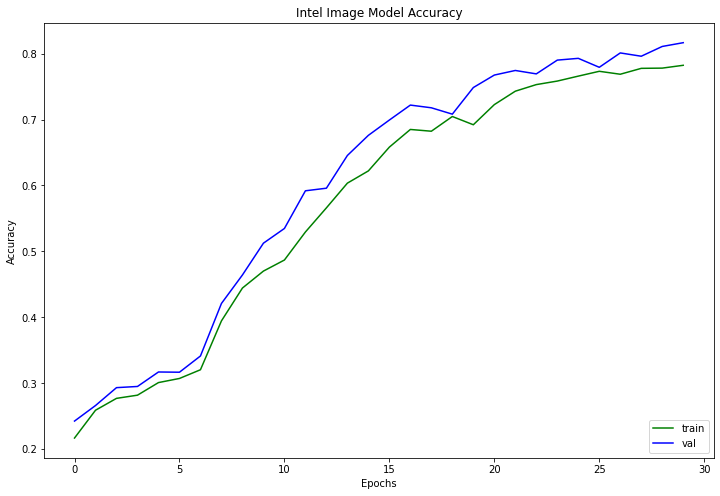

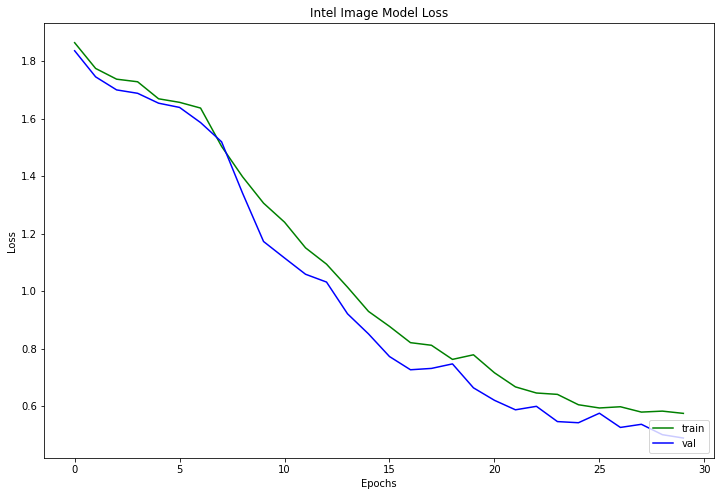

In [46]:
plot_accuray(history)
plot_loss(history)

****turns out that the model performans doesn't saturated yet and can continue training to get better performance****

****we can increase the epochs to improve the performance****

# Loading test dataset

In [47]:
test_path = "../input/seti-data/primary_small/test"
test_classes = sorted(os.listdir(test_path))
test_classes

['brightpixel',
 'narrowband',
 'narrowbanddrd',
 'noise',
 'squarepulsednarrowband',
 'squiggle',
 'squigglesquarepulsednarrowband']

In [48]:
test_dataset = image_dataset_from_directory(
  test_path,
  batch_size = batch_size,  
  image_size=(img_height, img_width))

Found 700 files belonging to 7 classes.


****We resized the test images in the loading function (image_size parameter)****

****now we need to rescale to to be from 0 to 1 using normalizing_layer we created before****

In [49]:
test_dataset = test_dataset.map(lambda x, y: (normalizing_layer(x), y))

In [51]:
img_batch = next(iter(test_dataset))
first_img = img_batch[0]

print(np.min(first_img), ' --> ', np.max(first_img))

0.012254903  -->  0.7553922


****all image range from 0 to 1****

# Evaluating Model

In [65]:
loss, acc = model.evaluate(test_dataset)

6/6 [==============================] - 6s 127ms/step - loss: 0.5754 - accuracy: 0.7771


In [66]:
loss

0.5753979086875916

In [67]:
acc = acc * 100

In [68]:
print('{:.2f}%'.format(acc))

77.71%
